In [246]:
# CS180 (CS280A): Project 1 starter Python code

# these are just some suggested libraries
# instead of scikit-image you could use matplotlib and opencv to read, write, and display images

import numpy as np
import skimage as sk
import skimage.io as skio
import logging
import matplotlib.pyplot as plt
import skimage.exposure as exposure
import skimage.color as color
import os
import scipy
import cv2
import skimage.transform as transform
from skimage.draw import polygon
import imageio

from IPython.display import Image, display
import glob
import pandas as pd
import dlib
from scipy.ndimage import map_coordinates
from scipy.ndimage import distance_transform_edt


  # load the dlib model
# detector = dlib.get_frontal_face_detector()
# predictor_path = 'shape_predictor_68_face_landmarks.dat'  # Ensure this file is in your working directory
# predictor = dlib.shape_predictor(predictor_path)
# set up logging
# levels are DEBUG, INFO, WARNING, ERROR, CRITICAL
# logging.basicConfig(level=logging.CRITICAL)


In [247]:
OUTPUT_PATH = '../../outputs/'
DATA_PATH = '../../../data/'

def load_image_as_float(imname):
    # concatenate the image name with the path
    imname = DATA_PATH + imname
    im = skio.imread(imname)
    # convert to float (might want to do this later on to save memory)
    im = sk.img_as_float(im)
    return im

def show_image(im, title=None):
    plt.figure()
    plt.imshow(im)
    plt.axis('off')
    if title is not None:
        plt.title(title)
    plt.show()

def export_image(im, imname, path=OUTPUT_PATH):
    # Convert RGBA to RGB if necessary
    if im.shape[-1] == 4:
        im = color.rgba2rgb(im)
    # convert to jpg
    im = sk.img_as_ubyte(im)
    fname = path + imname.split('.')[0] + '.jpg'
    skio.imsave(fname, im)

In [285]:
def show_image_with_points(image, points, title=None, s=5):
    plt.figure()
    plt.imshow(image)
    plt.scatter(points[:, 0], points[:, 1], c='r', marker='.', s=s)
    if title is not None:
        plt.title(title)
    plt.show()

def show_collection_of_images(images):
    plt.figure()
    for i, image in enumerate(images):
        plt.subplot(1, len(images), i+1)
        plt.imshow(image)
        plt.axis('off')
    plt.show()

def show_collection_of_images_with_titles(images, titles):
    plt.figure(figsize=(15, 5))  # Adjust figure size for better layout
    for i, image in enumerate(images):
        plt.subplot(1, len(images), i+1)
        plt.imshow(image)
        plt.axis('off')
        plt.title(titles[i], wrap=True)  # Enable text wrapping
    plt.tight_layout()  # Adjust subplot layout
    plt.show()

In [249]:
# crop image from the bottom, to match target image ratio
def crop_image(im, target_im):
    # get the target ratio
    target_ratio = target_im.shape[0] / target_im.shape[1]
    # print("target_ratio: ", target_ratio)
    # get the aspect ratio of the image
    im_ratio = im.shape[0] / im.shape[1]
    # print("im_ratio: ", im_ratio)
    # crop the image to match the target ratio
    if im_ratio > target_ratio:
        # crop the image from the bottom
        im = im[:int(im.shape[1] * target_ratio), :]
    else:
        # crop the image from the right and left equally
        # Calculate the width to crop from each side
        # w1 - (h1*w2)/h2 = x
        crop_width = int((im.shape[1] - ((im.shape[0]*target_im.shape[1]) / target_im.shape[0])) / 2)
        # Crop the image from the right and left equally
        im = im[:, crop_width:-crop_width]

    # print("new ratio: ", im.shape[0] / im.shape[1])
    return im

In [250]:
def match_dimensions(changingImage, targetImage):
    # resize the changing image to match the target image dimensions
    changingImage = transform.resize(changingImage, targetImage.shape[:2])
    return changingImage

def addWhiteSpace(image, percent, direction):
    # add white space by the percent in the specified direction
    # direction is 'top', 'bottom', 'left', or 'right'
    # percent is a float between 0 and 1
    # add white space to the image
    if direction == 'top':
        image = np.pad(image, ((int(image.shape[0] * percent), 0), (0, 0), (0, 0)))
    elif direction == 'bottom':
        image = np.pad(image, ((0, int(image.shape[0] * percent)), (0, 0), (0, 0)))
    elif direction == 'left':
        image = np.pad(image, ((0, 0), (int(image.shape[1] * percent), 0), (0, 0)))
    elif direction == 'right':
        image = np.pad(image, ((0, 0), (0, int(image.shape[1] * percent)), (0, 0)))
    return image

def generate_canvas(image, padding=100):
    canvas = np.ones((image.shape[0] + padding, image.shape[1] + padding, 3))
    return canvas

In [251]:
# import json
import json

def import_correspondences(im1_name, im2_name, im1=None, im2=None):
    # take off the .jpeg if its there
    im1_name = im1_name.split('.')[0]
    im2_name = im2_name.split('.')[0]
    # load the json file
    json_path = DATA_PATH + im1_name + '_' + im2_name + '.json'
    with open(json_path, 'r') as f:
        correspondences = json.load(f)

    # get the points
    im1Points = correspondences['im1Points']
    im2Points = correspondences['im2Points']
    print("len of im1Points: ", len(im1Points))

    # add points to the corner of each image
    # im1Points.append((0, 0))
    # im2Points.append((0, 0))
    # im1Points.append((0, im1.shape[0]-1))
    # im2Points.append((0, im2.shape[0]-1))
    # im1Points.append((im1.shape[1]-1, 0))
    # im2Points.append((im2.shape[1]-1, 0))
    # im1Points.append((im1.shape[1]-1, im1.shape[0]-1))
    # im2Points.append((im2.shape[1]-1, im2.shape[0]-1))
    # calculate midway points without using for loops
    im1Points = np.array(im1Points)
    im2Points = np.array(im2Points) 

    return im1Points, im2Points

# Image Rectification on frames

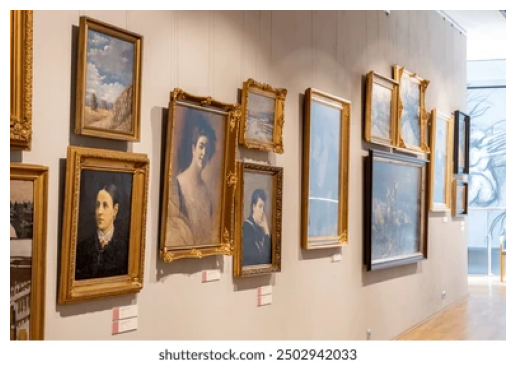

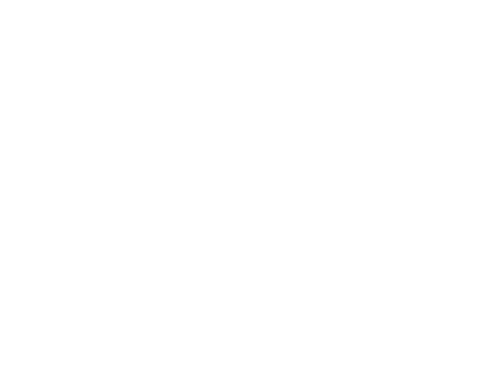

/var/folders/zq/lptg8bhj1_7csl86sd1517pc0000gn/T/ipykernel_85216/448437520.py:27: UserWarning: ../../../data/canvas.jpg is a low contrast image
  skio.imsave(fname, im)


In [252]:
# import image
gallery = load_image_as_float('gallery.webp')
show_image(gallery)

# generate canvas with matching dimensions
canvas = generate_canvas(gallery)
show_image(canvas)
export_image(canvas, 'canvas', DATA_PATH)

In [253]:
%matplotlib inline

gallery_points:  [[ 56.86774194   8.66129032]
 [101.1516129   22.2483871 ]
 [ 97.12580645 100.7516129 ]
 [ 52.33870968  95.71935484]]


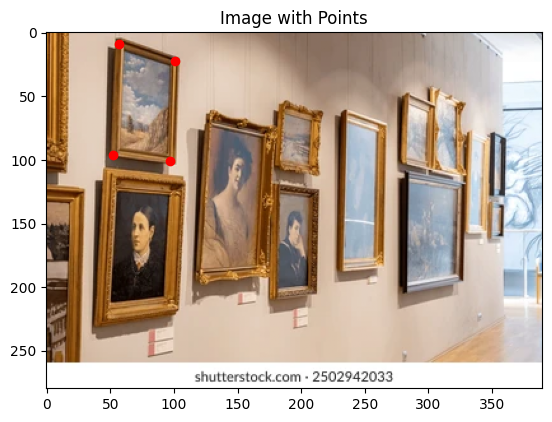

In [254]:
# define corrspondences, create points for an image
# use ginput to get points from user
def select_points(image, n):
    """
    Allow the user to select n points on the given image.
    
    Args:
    image (numpy.ndarray): The image on which to select points.
    n (int): The number of points to select.
    
    Returns:
    numpy.ndarray: A nx2 array of selected points.
    """
    # set the ginput to be not in inline
    %matplotlib qt

    # Display the image
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.title(f"Select {n} points")

    
    # Let the user select n points
    points = plt.ginput(n, timeout=-1)
    
    # Close the plot
    plt.close()
    
    # Convert the list of tuples to an nx2 numpy array
    points_array = np.array(points)
    
    # set back to inline
    %matplotlib inline
    return points_array


gallery_points = select_points(gallery, 4)
print("gallery_points: ", gallery_points)
show_image_with_points(gallery, gallery_points)


In [255]:
# generate canvas
def generate_canvas(image, padding=100):
    canvas = np.zeros((image.shape[0] + padding, image.shape[1] + padding, 3))
    return canvas

def generate_canvas_from_points(points, padding=0):
    # Calculate the bounding box
    min_x = np.min(points[:, 0])
    min_y = np.min(points[:, 1])
    max_x = np.max(points[:, 0])
    max_y = np.max(points[:, 1])

    # generate corners
    corners = np.array([[min_x, min_y], [min_x, max_y], [max_x, min_y], [max_x, max_y]])
    # Calculate the origin offset
    origin_offset = (min_x - padding, min_y - padding)
    
    # Calculate canvas dimensions
    canvas_width = int(max_x - min_x + 2 * padding)
    canvas_height = int(max_y - min_y + 2 * padding)
    
    # Create the canvas
    canvas = np.zeros((canvas_height, canvas_width, 3))
    
    return canvas, origin_offset, corners

def generate_rectangle_points(length, width):
    points = np.array([[0, 0], [0, length], [width, 0], [width, length]])
    return points



# Recover Homographies

In [256]:
gallery_points, canvas_points = import_correspondences('gallery', 'canvas')
print("gallery_points shape: ", gallery_points.shape)
print("canvas_points shape: ", canvas_points.shape)
print("gallery_points: ", gallery_points)
print("canvas_points: ", canvas_points) 

len of im1Points:  4
gallery_points shape:  (4, 2)
canvas_points shape:  (4, 2)
gallery_points:  [[ 55  94]
 [100 101]
 [104  25]
 [ 58   9]]
canvas_points:  [[ 67 142]
 [179 142]
 [179  33]
 [ 68  33]]


new_points:  [[ 67 142]
 [179 141]
 [178  32]
 [ 68  32]]


/var/folders/zq/lptg8bhj1_7csl86sd1517pc0000gn/T/ipykernel_85216/3774766964.py:21: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  h = np.linalg.lstsq(A, B)[0]


warped_im shape:  (1571, 4358, 3)


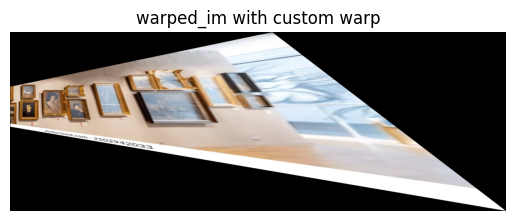

In [257]:
def computeH(im1Points, im2Points):
    # points are n by 2
    n = im1Points.shape[0]
    # Ah = B
    # compute the homography matrix given n points
    A = []
    B = []
    # fill in A and B
    for i in range(n):
        x1, y1 = im1Points[i, 0], im1Points[i, 1]
        x2, y2 = im2Points[i, 0], im2Points[i, 1]
        A.append([x1, y1, 1, 0, 0, 0, -x2*x1, -x2*y1])
        A.append([0, 0, 0, x1, y1, 1, -y2*x1, -y2*y1])
        B.append(x2)
        B.append(y2)
        
    A = np.array(A)
    B = np.array(B)

    # solve for h
    h = np.linalg.lstsq(A, B)[0]
    # reshape h
    h = np.append(h, 1)
    h = h.reshape((3, 3))
    return h

# def warpImage(im, H):
    # warp the image using the homography matrix
    # warped_im = cv2.warpPerspective(im, H, (im.shape[1], im.shape[0]))
    # first warp the corners of the image to get the dimensions of the warped image
    corners = np.array([[0, 0], [0, im.shape[0]-1], [im.shape[1]-1, 0], [im.shape[1]-1, im.shape[0]-1]])
    
    print("corners: ", corners)
    homogeneous_corners = np.hstack((corners, np.ones((corners.shape[0], 1))))
    warped_corners = H @ homogeneous_corners.T
    # convert back to homogeneous coordinates
    warped_corners = warped_corners / warped_corners[2, :] # normalize
    warped_corners = warped_corners[:2, :].T # convert back to cartesian coordinates
    # display the warped corners
    show_image_with_points(im, warped_corners)
    # get the dimensions of the warped image
    warped_height = int(np.max(warped_corners[:, 1]) - np.min(warped_corners[:, 1]))
    warped_width = int(np.max(warped_corners[:, 0]) - np.min(warped_corners[:, 0]))
    print("warped_height: ", warped_height)
    print("warped_width: ", warped_width)
    # warp the image
    warped_im = cv2.warpPerspective(im, H, (warped_width, warped_height))
    return warped_im

def custom_warp(im, H):
    # Step 1: Compute the warped corners of the input image
    h, w = im.shape[:2]
    corners = np.array([
        [0, 0],          # Top-left corner
        [w - 1, 0],      # Top-right corner
        [w - 1, h - 1],  # Bottom-right corner
        [0, h - 1]       # Bottom-left corner
    ])
    ones = np.ones((4, 1))
    homogeneous_corners = np.hstack([corners, ones])  # Shape: (4, 3)

    # Apply homography to corners
    warped_corners = (H @ homogeneous_corners.T).T  # Shape: (4, 3)
    warped_corners /= warped_corners[:, [2]]        # Normalize
    warped_corners = warped_corners[:, :2]          # Convert back to Cartesian coordinates

    # Step 2: Compute the bounding box of the warped image
    all_corners = np.vstack([warped_corners, corners])
    x_coords = all_corners[:, 0]
    y_coords = all_corners[:, 1]
    x_min = int(np.floor(np.min(x_coords)))
    x_max = int(np.ceil(np.max(x_coords)))
    y_min = int(np.floor(np.min(y_coords)))
    y_max = int(np.ceil(np.max(y_coords)))

    # Step 3: Compute offsets to handle negative coordinates
    x_offset = -x_min if x_min < 0 else 0
    y_offset = -y_min if y_min < 0 else 0

    # Step 4: Create the output canvas
    canvas_width = x_max - x_min + 1
    canvas_height = y_max - y_min + 1
    if im.ndim == 3:
        canvas = np.zeros((canvas_height, canvas_width, im.shape[2]), dtype=im.dtype)
    else:
        canvas = np.zeros((canvas_height, canvas_width), dtype=im.dtype)

    # Step 5: Adjust the warped corners for the offset
    warped_corners_offset = warped_corners + np.array([x_offset, y_offset])
    corners_offset = corners + np.array([x_offset, y_offset])

    # Step 6: Generate a mask of the polygon in the canvas
    rr, cc = polygon(warped_corners_offset[:, 1], warped_corners_offset[:, 0], shape=canvas.shape)

    # Step 7: Map canvas coordinates back to source image coordinates using inverse homography
    num_points = len(rr)
    canvas_coords = np.vstack((cc, rr)).T  # Shape: (num_points, 2)

    # Adjust coordinates by subtracting the offset
    canvas_coords_in_warped = canvas_coords - np.array([x_offset, y_offset])

    # Convert to homogeneous coordinates
    ones = np.ones((num_points, 1))
    canvas_coords_homogeneous = np.hstack([canvas_coords_in_warped, ones])  # Shape: (num_points, 3)

    # Apply inverse homography
    H_inv = np.linalg.inv(H)
    source_coords_homogeneous = (H_inv @ canvas_coords_homogeneous.T).T  # Shape: (num_points, 3)
    source_coords = source_coords_homogeneous[:, :2] / source_coords_homogeneous[:, [2]]

    # Step 8: Interpolate pixel values using scipy.interpolate.griddata
    h_src, w_src = im.shape[:2]
    yy, xx = np.indices((h_src, w_src))
    source_points = np.vstack((xx.ravel(), yy.ravel())).T  # Shape: (h_src * w_src, 2)

    if im.ndim == 3:
        values = im.reshape(-1, im.shape[2])  # For color images
    else:
        values = im.ravel()  # For grayscale images

    # Perform interpolation
    interpolated_values = scipy.interpolate.griddata(
        source_points,
        values,
        source_coords,
        method='linear',
        fill_value=0
    )

    # Step 9: Assign interpolated values to the canvas
    if im.ndim == 3:
        canvas[rr, cc, :] = interpolated_values
    else:
        canvas[rr, cc] = interpolated_values

    return canvas, x_offset, y_offset


def applyHonOnepoint(point, H):
    # apply the homography matrix to the point
    new_point = np.dot(H, np.array([point[0], point[1], 1]))
    # normalize the point
    new_point = new_point / new_point[2]
    return new_point[:2]  # Return only x and y coordinates


def applyH(gallery_points, H):
    # apply the homography matrix to the points, simply output the new points
    # points are n by 2
    new_points = np.zeros_like(gallery_points)
    for i in range(gallery_points.shape[0]):
        new_points[i] = applyHonOnepoint(gallery_points[i], H)
    return new_points
# display each point as a different color
colors = ['r', 'y', 'g', 'b']
# print("gallery_points: ", gallery_points)
# print("canvas_points: ", canvas_points)
# print("gallery_points shape: ", gallery_points.shape)
# print("canvas_points shape: ", canvas_points.shape)
# compute the homography matrix
H = computeH(gallery_points, canvas_points)
new_points = applyH(gallery_points, H)
print("new_points: ", new_points)
# show_image_with_points(canvas, new_points, title='new_points')


# # # warp the image
# warped_im = warpImage(gallery, H)
# warped_im = np.roll(warped_im, 100, axis=0)
# print("warped_im shape: ", warped_im.shape)
# show_image(warped_im, "warped_im with cv2")

# warp the image with custom warp
warped_im, x_offset, y_offset = custom_warp(gallery, H)
# move the warped_im down 100 pixels
print("warped_im shape: ", warped_im.shape)
show_image(warped_im, "warped_im with custom warp")


In [258]:
def get_center_rectangle_points(image_width, image_height, padding=100):
    # Calculate the coordinates of the rectangle
    left = padding
    right = image_width - padding
    top = padding
    bottom = image_height - padding
    
    # Points in clockwise order
    points = np.array([[left, top], [right, top], [right, bottom], [left, bottom]])
    return points

In [272]:
def rectify_image(imagePath):
    image = load_image_as_float(imagePath)
    im1points, im2points = import_correspondences(imagePath, f'{imagePath.split(".")[0]}_canvas.jpg')
    
    # im1points = im1points[:4]
    # im2points = im2points[:4]
    # im2points = get_center_rectangle_points(image.shape[1], image.shape[0], padding=300)
    # show image with points
    show_image_with_points(image, im1points, title='im1points')
    show_image_with_points(canvas, im2points, title='im2points')
    
    # compute the homography matrix
    H = computeH(im1points, im2points)
    # warp the image
    warped_im, x_offset, y_offset = custom_warp(image, H)

    export_image(warped_im, f'/{imagePath.split(".")[0]}_rect.jpg')
    return warped_im

In [260]:

# generate a canvas for prez screen
def generate_canvas_for_prez(imagePath):
    image = load_image_as_float(imagePath)
    canvas = generate_canvas(image)
    export_image(canvas, f'/{imagePath.split(".")[0]}_canvas.jpg', DATA_PATH)
    return canvas

canvas = generate_canvas_for_prez('pres.jpeg')

/var/folders/zq/lptg8bhj1_7csl86sd1517pc0000gn/T/ipykernel_85216/448437520.py:27: UserWarning: ../../../data//pres_canvas.jpg is a low contrast image
  skio.imsave(fname, im)


len of im1Points:  9


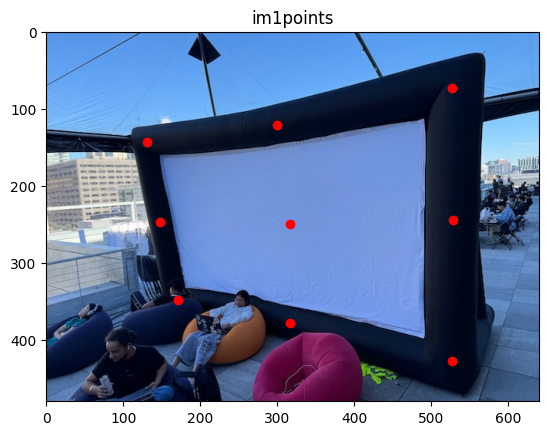

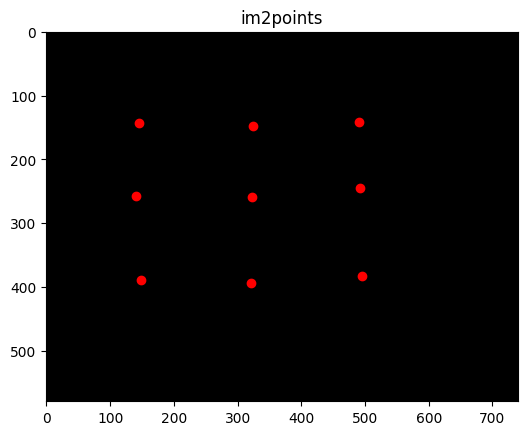

/var/folders/zq/lptg8bhj1_7csl86sd1517pc0000gn/T/ipykernel_85216/3774766964.py:21: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  h = np.linalg.lstsq(A, B)[0]


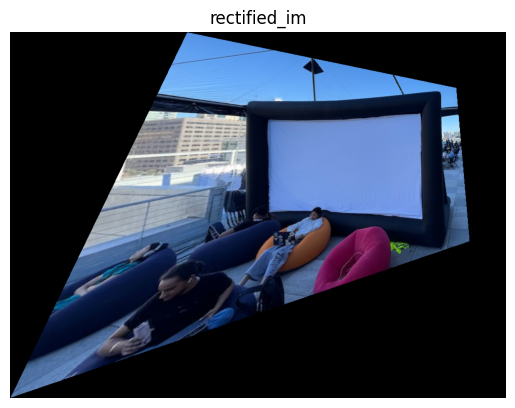

In [273]:
rectified_im = rectify_image('pres.jpeg')
show_image(rectified_im, "rectified_im")


In [84]:
# generate a canvas for tiles
generate_canvas_for_prez('tiles.jpeg')

/var/folders/zq/lptg8bhj1_7csl86sd1517pc0000gn/T/ipykernel_85216/448437520.py:27: UserWarning: ../../../data//tiles_canvas.jpg is a low contrast image
  skio.imsave(fname, im)


array([[[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       ...,

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]]])

len of im1Points:  10


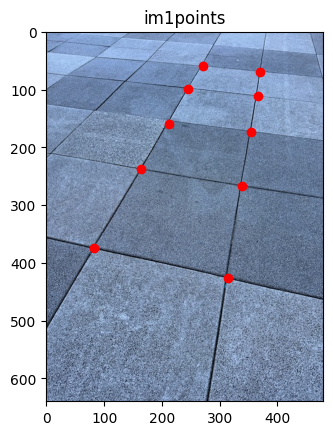

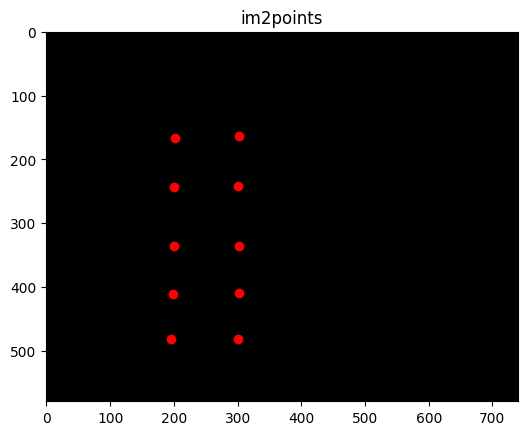

/var/folders/zq/lptg8bhj1_7csl86sd1517pc0000gn/T/ipykernel_85216/3774766964.py:21: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  h = np.linalg.lstsq(A, B)[0]


In [274]:
rectified_tiles = rectify_image('tiles.jpeg')
# show_image(rectified_tiles, "rectified_tiles")


# Warping images to create a homography

len of im1Points:  24


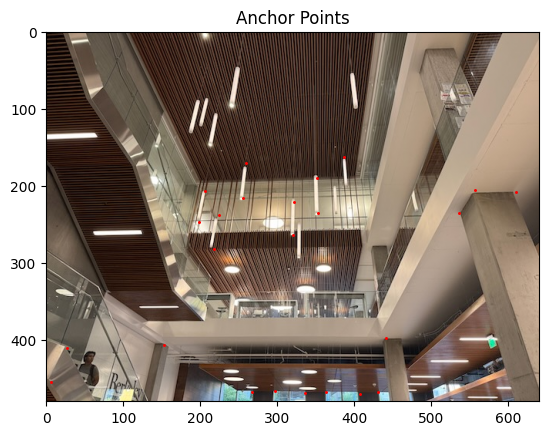

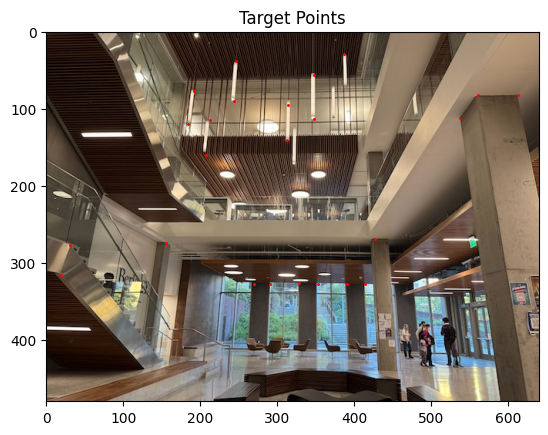

/var/folders/zq/lptg8bhj1_7csl86sd1517pc0000gn/T/ipykernel_85216/3774766964.py:21: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  h = np.linalg.lstsq(A, B)[0]


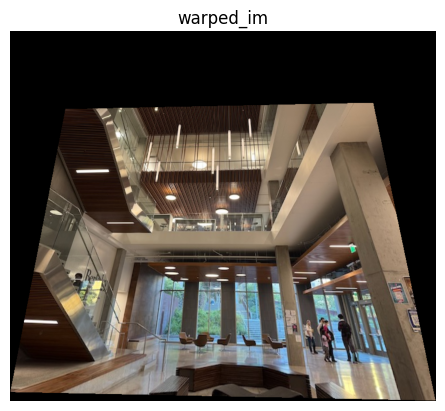

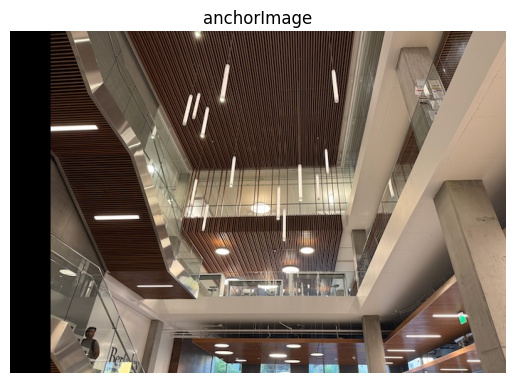

In [338]:
# Warp 2 images
# import images
# warp the right image to the left image
def create_homography(anchorImagePath, targetImagePath, H=None, plot=True):
    # import correspondences
    anchorImage = load_image_as_float(anchorImagePath)
    targetImage = load_image_as_float(targetImagePath)

    # import correspondences
    try:
        anchorPoints, targetPoints = import_correspondences(anchorImagePath, targetImagePath, anchorImage, targetImage)
    except:
        targetPoints, anchorPoints = import_correspondences(targetImagePath, anchorImagePath, targetImage, anchorImage)

    if plot:
        show_image_with_points(anchorImage, anchorPoints, title='Anchor Points')
        show_image_with_points(targetImage, targetPoints, title='Target Points')
    
    if H is None:
        # compute the homography matrix
        H = computeH(targetPoints, anchorPoints)

    # warp the image
    warped_im, x_offset, y_offset = custom_warp(targetImage, H)

    # shift anchor image by x_offset and y_offset
    if y_offset > 0:
        anchorImage = np.pad(anchorImage, ((y_offset, 0), (0, 0), (0, 0)), mode='constant')
    else:
        anchorImage = np.pad(anchorImage, ((0, -y_offset), (0, 0), (0, 0)), mode='constant')

    if x_offset > 0:
        anchorImage = np.pad(anchorImage, ((0, 0), (x_offset, 0), (0, 0)), mode='constant')
    else:
        anchorImage = np.pad(anchorImage, ((0, 0), (0, -x_offset), (0, 0)), mode='constant')
    return warped_im, anchorImage

warped_im, anchorImage = create_homography('IMG_2815.jpeg', 'IMG_2814 (1).jpeg')
show_image(warped_im, "warped_im")
# show original anchor image
show_image(anchorImage, "anchorImage")


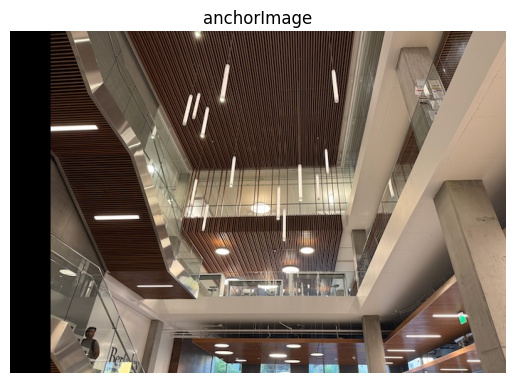

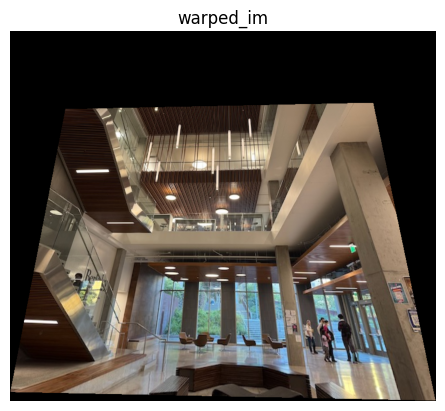

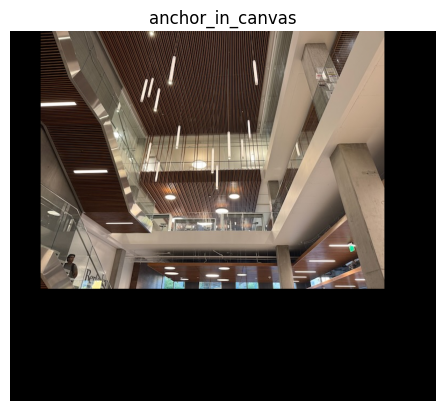

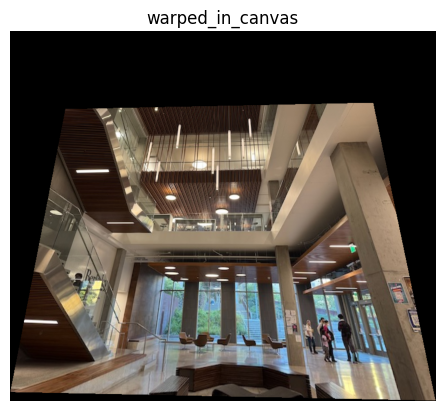

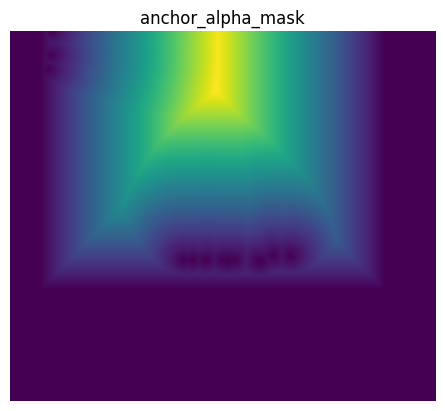

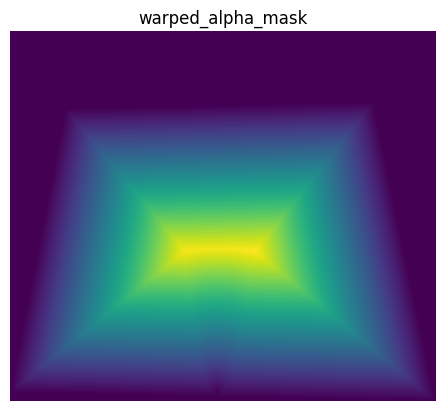

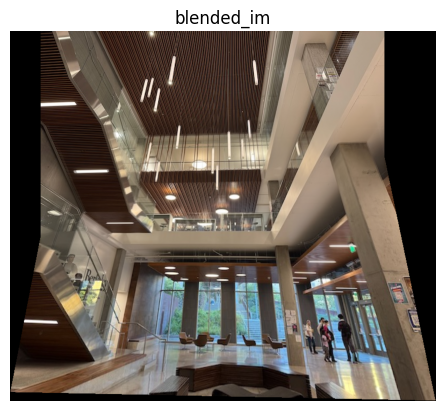

In [339]:
def dumb_blending(anchorImage, warpedImage):
    # create a canvas that is the size of both images added together
    joint_image = np.zeros((anchorImage.shape[0] + warpedImage.shape[0], anchorImage.shape[1] + warpedImage.shape[1], 3))
    print("joint_image shape: ", joint_image.shape)
    # weighted average
    joint_image[:anchorImage.shape[0], :anchorImage.shape[1]] = anchorImage
    joint_image[:warpedImage.shape[0], :warpedImage.shape[1]] = warpedImage + joint_image[:warpedImage.shape[0], :warpedImage.shape[1]]
    return joint_image

def put_image_in_canvas(image, canvas):
    # put the image in the canvas
    canvas[:image.shape[0], :image.shape[1]] = image
    return canvas

def compute_distance_transform(image_mask):
    # Compute the Euclidean distance transform
    dist_transform = distance_transform_edt(image_mask)
    # Normalize to the range [0, 1]
    dist_transform = dist_transform / np.max(dist_transform)
    return dist_transform

def generate_alpha_mask(image):
    # Convert image to 8-bit unsigned integer forma
    image = (image * 255).astype(np.uint8)
    threshold = 0
    mask = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) > threshold
    dist_transform = compute_distance_transform(mask)
    return dist_transform

def generate_blend_canvas(anchorImage, warpedImage):
    # generate canvas
    # joint_image = np.zeros((anchorImage.shape[0] + warpedImage.shape[0], anchorImage.shape[1] + warpedImage.shape[1], 3))

    # Calculate the maximum dimensions needed to contain both images
    max_height = max(anchorImage.shape[0], warpedImage.shape[0])
    max_width = max(anchorImage.shape[1], warpedImage.shape[1])
    
    # Create a canvas with these maximum dimensions
    canvas = np.zeros((max_height, max_width, 3))

    return canvas

def blend_images(anchorImage, warpedImage, anchorImagePath="anchorImage", warpedImagePath="warpedImage"):
    # generate canvas
    anchor_blank_canvas = generate_blend_canvas(anchorImage, warpedImage)
    warped_blank_canvas = generate_blend_canvas(warpedImage, anchorImage)

    # put the images in the canvas
    anchor_in_canvas = put_image_in_canvas(anchorImage, anchor_blank_canvas)
    warped_in_canvas = put_image_in_canvas(warpedImage, warped_blank_canvas)
    show_image(anchor_in_canvas, "anchor_in_canvas")
    show_image(warped_in_canvas, "warped_in_canvas")
    export_image(anchor_in_canvas, f'/{anchorImagePath.split(".")[0]}_{warpedImagePath.split(".")[0]}_anchor_in_canvas.jpg')
    export_image(warped_in_canvas, f'/{warpedImagePath.split(".")[0]}_{anchorImagePath.split(".")[0]}_warped_in_canvas.jpg')

    # generate alpha mask
    anchor_alpha_mask = generate_alpha_mask(anchor_in_canvas)
    warped_alpha_mask = generate_alpha_mask(warped_in_canvas)
    show_image(anchor_alpha_mask, "anchor_alpha_mask")
    show_image(warped_alpha_mask, "warped_alpha_mask")
    export_image(anchor_alpha_mask, f'/{anchorImagePath.split(".")[0]}_{warpedImagePath.split(".")[0]}_anchor_alpha_mask.jpg')
    export_image(warped_alpha_mask, f'/{warpedImagePath.split(".")[0]}_{anchorImagePath.split(".")[0]}_warped_alpha_mask.jpg')

    # blend the images together
    # weighted average for each channel
    total_alpha_mask = anchor_alpha_mask + warped_alpha_mask
    non_zero_mask = total_alpha_mask > 0
    # separate for each channel
    for i in range(3):
        anchor_blank_canvas[:, :, i] = ((anchor_in_canvas[:, :, i] * anchor_alpha_mask) + (warped_in_canvas[:, :, i] * warped_alpha_mask))
        anchor_blank_canvas[:, :, i] = np.divide(anchor_blank_canvas[:, :, i], total_alpha_mask, where=non_zero_mask)

    
    return anchor_blank_canvas
show_image(anchorImage, "anchorImage")
show_image(warped_im, "warped_im")

blended_im = blend_images(anchorImage, warped_im)
export_image(blended_im, '_blended.jpg')
show_image(blended_im, "blended_im")

len of im1Points:  13


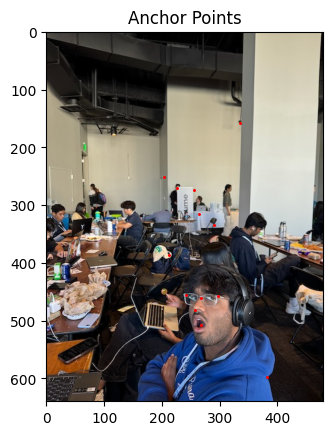

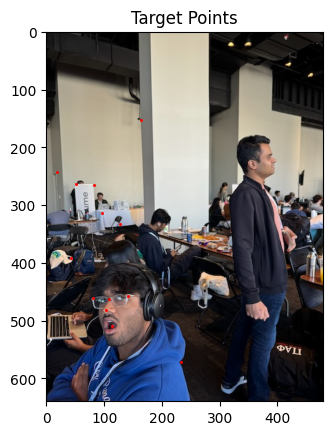

/var/folders/zq/lptg8bhj1_7csl86sd1517pc0000gn/T/ipykernel_85216/3774766964.py:21: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  h = np.linalg.lstsq(A, B)[0]


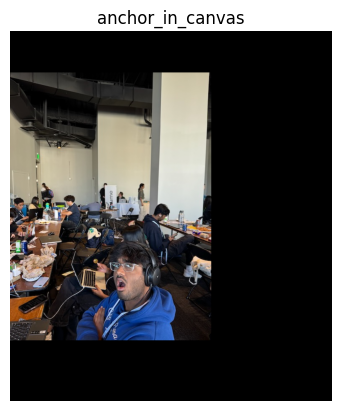

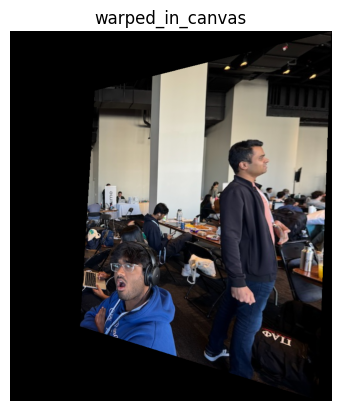

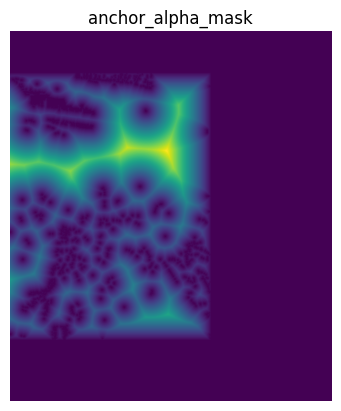

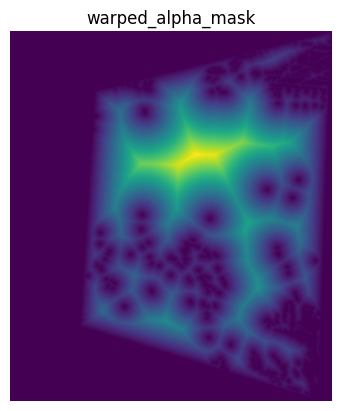

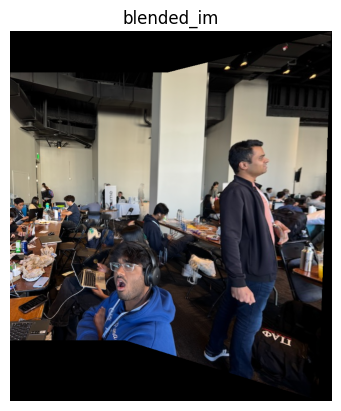

In [335]:
def full_homography(anchorImagePath, targetImagePath, H=None, plot=True):
    warped_im, anchorImage = create_homography(anchorImagePath, targetImagePath, H=H, plot=plot)
    blended_im = blend_images(anchorImage, warped_im, anchorImagePath, targetImagePath)
    export_image(blended_im, f'/{anchorImagePath.split(".")[0]}_{targetImagePath.split(".")[0]}_blended.jpg')
    return blended_im

blended_im = full_homography('IMG_2827.jpeg', 'IMG_2828.jpeg')
show_image(blended_im, "blended_im")

len of im1Points:  10


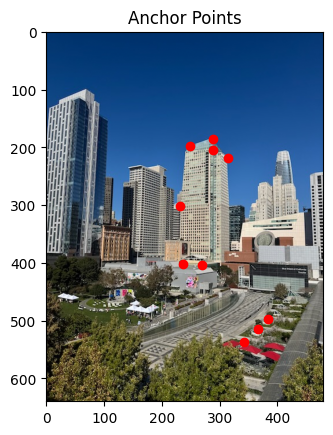

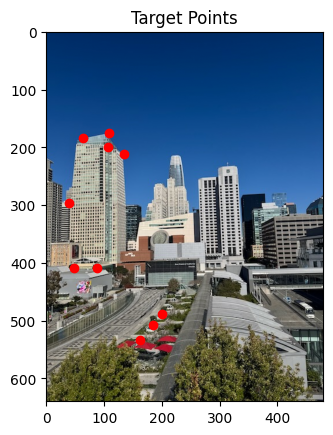

/var/folders/zq/lptg8bhj1_7csl86sd1517pc0000gn/T/ipykernel_85216/3774766964.py:21: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  h = np.linalg.lstsq(A, B)[0]


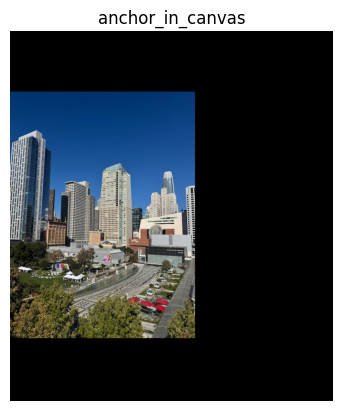

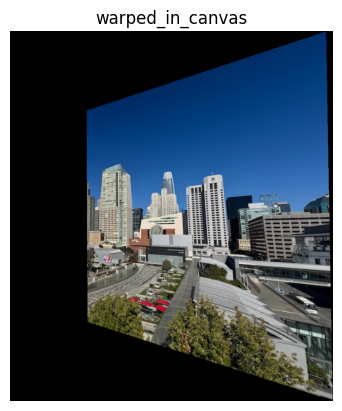

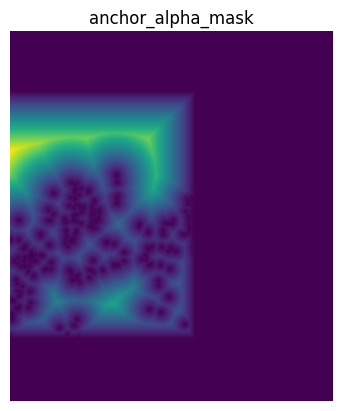

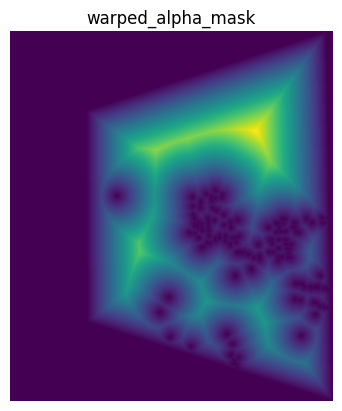

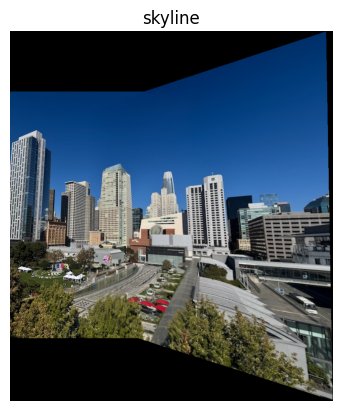

In [245]:
skyline = full_homography('IMG_2830.jpeg', 'IMG_2831.jpeg')
show_image(skyline, "skyline")

# PART 2
# %%


In [115]:
import numpy as np
from skimage.feature import corner_harris, peak_local_max


def get_harris_corners(im, edge_discard=20, threshold=0):
    """
    This function takes a b&w image and an optional amount to discard
    on the edge (default is 5 pixels), and finds all harris corners
    in the image. Harris corners near the edge are discarded and the
    coordinates of the remaining corners are returned. A 2d array (h)
    containing the h value of every pixel is also returned.

    h is the same shape as the original image, im.
    coords is 2 x n (ys, xs).
    """

    assert edge_discard >= 20

    # convert to grayscale if needed
    if im.ndim == 3:
        im = (im * 255).astype(np.uint8)
        im = cv2.cvtColor(im, cv2.COLOR_RGB2GRAY)

    # find harris corners
    h = corner_harris(im, method='eps', sigma=1)
    coords = peak_local_max(h, min_distance=1)

    # discard points on edge
    edge = edge_discard  # pixels
    mask = (coords[:, 0] > edge) & \
           (coords[:, 0] < im.shape[0] - edge) & \
           (coords[:, 1] > edge) & \
           (coords[:, 1] < im.shape[1] - edge)
    
    if threshold > 0:
        # Get h values at corner coordinates
        h_values = h[coords[:, 0], coords[:, 1]]
        mask = mask & (h_values > threshold)
    
    coords = coords[mask].T
    # I ADDED THIS
    coords = coords.T
    # switch x and y
    coords = coords[:, [1, 0]]
    return h, coords


def dist2(x, c):
    """
    dist2  Calculates squared distance between two sets of points.

    Description
    D = DIST2(X, C) takes two matrices of vectors and calculates the
    squared Euclidean distance between them.  Both matrices must be of
    the same column dimension.  If X has M rows and N columns, and C has
    L rows and N columns, then the result has M rows and L columns.  The
    I, Jth entry is the  squared distance from the Ith row of X to the
    Jth row of C.

    Adapted from code by Christopher M Bishop and Ian T Nabney.
    """
    
    ndata, dimx = x.shape
    ncenters, dimc = c.shape
    assert(dimx == dimc, 'Data dimension does not match dimension of centers')

    return (np.ones((ncenters, 1)) * np.sum((x**2).T, axis=0)).T + \
            np.ones((   ndata, 1)) * np.sum((c**2).T, axis=0)    - \
            2 * np.inner(x, c)


<>:65: SyntaxWarning: assertion is always true, perhaps remove parentheses?
<>:65: SyntaxWarning: assertion is always true, perhaps remove parentheses?
/var/folders/zq/lptg8bhj1_7csl86sd1517pc0000gn/T/ipykernel_85216/1599777303.py:65: SyntaxWarning: assertion is always true, perhaps remove parentheses?
  assert(dimx == dimc, 'Data dimension does not match dimension of centers')


coords shape:  (1490, 2)


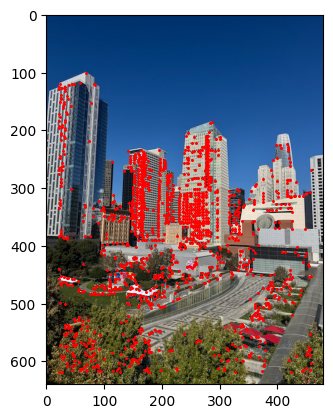

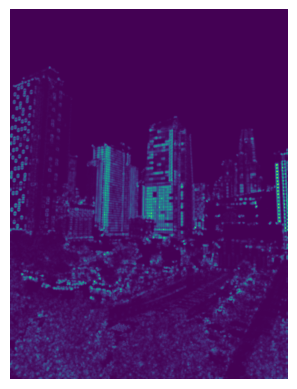

In [286]:
# import image of SF
image_sf = load_image_as_float('IMG_2830.jpeg')
# get harris corners
h, coords = get_harris_corners(image_sf, edge_discard=20, threshold=0.5)
print("coords shape: ", coords.shape)

show_image_with_points(image_sf, coords)
show_image(h)
# export image with points

# get harris 
# %%


## Implement Adaptive Non-Maximal Suppression

We slowly decrease the radius of the circle around each point in our existing set,...

Order the cornerStrengths, start with the highest with r=inf, 
slowly decrease r until we find a point that is not within the radius,
then add that point to the set
continue decreasing r around every point in the set, adding points until we have the desired number of points
%%

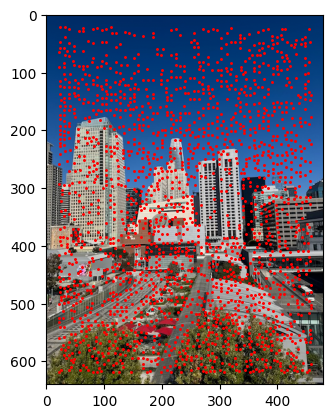

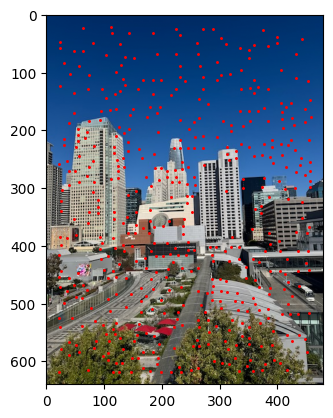

In [292]:

def ANMS(coords, h_values, n_best=500, c_robust=1):
    N = coords.shape[0]
    f = h_values
    f_i_scaled = c_robust * f

    # Compute the comparison matrix
    f_matrix = np.tile(f, (N, 1))
    f_i_scaled_matrix = np.tile(f_i_scaled[:, np.newaxis], (1, N))
    F_compare = f_matrix > f_i_scaled_matrix

    # Exclude self-comparison
    np.fill_diagonal(F_compare, False)

    # Compute squared distances between all points
    D2 = dist2(coords, coords)

    # Initialize suppression radii
    r = np.full(N, np.inf)

    # Compute minimum suppression radius for each corner
    for i in range(N):
        mask = F_compare[i, :]
        if np.any(mask):
            distances_sq = D2[i, mask]
            r[i] = np.sqrt(np.min(distances_sq))

    # Select the top n_best corners with the largest suppression radius
    indices = np.argsort(-r)
    selected_indices = indices[:n_best]
    selected_coords = coords[selected_indices]

    return selected_coords

def ANMS_help(h, coords, n_best=500, c_robust=1):
    h_values = h[coords[:, 1], coords[:, 0]]
    selected_coords = ANMS(coords, h_values, n_best=n_best, c_robust=c_robust)
    return selected_coords

def ANMS_wrapper(imagePath, n_best=500, c_robust=1, harris_threshold=0):
    original_image = load_image_as_float(imagePath)
    image = (original_image * 255).astype(np.uint8)
    image_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    h, coords = get_harris_corners(image_gray, edge_discard=20, threshold=harris_threshold)
    selected_coords = ANMS_help(h, coords, n_best=n_best, c_robust=c_robust)
    return selected_coords, original_image

selected_coords, original_image = ANMS_wrapper('IMG_2831.jpeg', n_best=2000, c_robust=0.9)
show_image_with_points(original_image, selected_coords)
selected_coords, original_image = ANMS_wrapper('IMG_2831.jpeg', n_best=500, c_robust=0.9)
show_image_with_points(original_image, selected_coords)
# %%



## implementing Feature Descriptor extraction


In [93]:
# 1. raise the image to a higher pyramid level
# 2. sample patch of pixels around each point
     # 8 by 8 grid of pixels every s=5 pixels
# 3. normalize so that mean is 0 and std is 1

In [295]:
def visualize_descriptors(descriptors, num_descriptors=20):
    
    num_descriptors = min(num_descriptors, len(descriptors))
    plt.figure(figsize=(10, 2))

    for i in range(num_descriptors):
        descriptor = descriptors[i]

        # Reshape to 8x8
        descriptor_image = descriptor.reshape(8, 8)

        # Normalize for display (map values to 0-1)
        descriptor_image -= descriptor_image.min()
        descriptor_image /= descriptor_image.max()

        # Plot
        plt.subplot(1, num_descriptors, i + 1)
        plt.imshow(descriptor_image, cmap='gray')
        plt.axis('off')
        plt.title(f'{i+1}')

    plt.tight_layout()
    plt.show()

descriptors shape:  (500, 64)


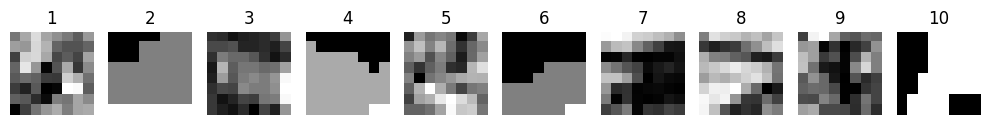

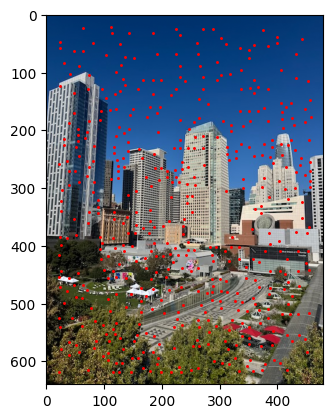

In [301]:
import skimage

def extract_features(im, keypoints, window_size=40, descriptor_size=8, sampling_rate=5):

    if im.ndim == 3:
        im = (im * 255).astype(np.uint8)
        im = cv2.cvtColor(im, cv2.COLOR_RGB2GRAY)

    descriptors = []
    valid_keypoints = []

    # Compute scaling factor
    scale_factor = descriptor_size * sampling_rate / window_size

    # Resize the image to the sampling scale
    im_sample = skimage.transform.resize(im, (int(im.shape[0] * scale_factor), int(im.shape[1] * scale_factor)), mode='reflect', anti_aliasing=True)

    # Adjust keypoints coordinates to the sampling scale
    scaled_keypoints = keypoints * scale_factor

    # Half window size at sampling level
    half_window = descriptor_size // 2  # Since we're sampling descriptor_size x descriptor_size patches

    im_height, im_width = im_sample.shape

    for idx, (x, y) in enumerate(scaled_keypoints):
        x, y = int(round(x)), int(round(y))

        # Ensure the window is within image bounds
        if x - half_window < 0 or x + half_window >= im_width or \
           y - half_window < 0 or y + half_window >= im_height:
            continue

        # Extract the window around the keypoint
        window = im_sample[y - half_window:y + half_window, x - half_window:x + half_window]

        # Flatten the descriptor to a 1D vector
        descriptor = window.flatten()

        # Bias/Gain Normalization
        mean = np.mean(descriptor)
        std = np.std(descriptor)
        descriptor = np.divide(descriptor, std, where=(std!=0))

        descriptors.append(descriptor)
        valid_keypoints.append(keypoints[idx])

    descriptors = np.array(descriptors)
    valid_keypoints = np.array(valid_keypoints)
    return descriptors, valid_keypoints

descriptors, valid_keypoints = extract_features(image_sf, selected_coords)
print("descriptors shape: ", descriptors.shape)
visualize_descriptors(descriptors, num_descriptors=10)
show_image_with_points(image_sf, valid_keypoints)



# Feature Matching

compute the distances between features
apply Lowe's ratio test

In [302]:
from scipy.spatial import cKDTree  # Using cKDTree for faster performance

def match_features(descriptors1, descriptors2, ratio_threshold=0.4):
   
    matches = []

    # Build KD-Tree for descriptors2
    tree = cKDTree(descriptors2)

    # For each descriptor in descriptors1, find the two nearest neighbors in descriptors2
    distances, indices = tree.query(descriptors1, k=2)

    # Ensure that distances and indices are 2D arrays
    if distances.ndim == 1:
        distances = distances[:, np.newaxis]
        indices = indices[:, np.newaxis]

    for i in range(len(descriptors1)):
        if len(distances[i]) < 2:
            continue  # Not enough neighbors

        closest_distance = distances[i][0]
        second_closest_distance = distances[i][1]

        # Apply Lowe's ratio test
        if closest_distance / second_closest_distance < ratio_threshold:
            # Append the match as a pair of indices
            matches.append((i, indices[i][0]))

    return matches

In [305]:
import matplotlib.pyplot as plt

def plot_matches(im1, im2, keypoints1, keypoints2, matches):
    """
    Plots the matched features between two images.

    Parameters:
    - im1: Image 1.
    - im2: Image 2.
    - keypoints1: Keypoints from image 1 (N x 2 array).
    - keypoints2: Keypoints from image 2 (M x 2 array).
    - matches: List of matched indices [(index_in_image1, index_in_image2), ...].

    Returns:
    - None
    """
    # Create a combined image
    height1, width1 = im1.shape[:2]
    height2, width2 = im2.shape[:2]
    combined_image = np.zeros((max(height1, height2), width1 + width2, 3), dtype=im1.dtype)
    combined_image[0:height1, 0:width1] = im1
    combined_image[0:height2, width1:width1 + width2] = im2

    # Adjust keypoints coordinates for the combined image
    keypoints2_shifted = keypoints2.copy()
    keypoints2_shifted[:, 0] += width1  # Shift x-coordinates

    # Plot the matches
    plt.figure(figsize=(12, 6))
    plt.imshow(combined_image)
    for idx1, idx2 in matches:
        x1, y1 = keypoints1[idx1]
        x2, y2 = keypoints2_shifted[idx2]
        plt.plot([x1, x2], [y1, y2], 'c-', linewidth=0.5)
        plt.plot(x1, y1, 'ro', markersize=3)
        plt.plot(x2, y2, 'ro', markersize=3)
    plt.axis('off')
    plt.title('Feature Matches')
    plt.show()

matches shape:  80
matches:  [(4, 242), (6, 2), (7, 3), (8, 5), (12, 4), (14, 12), (15, 6), (18, 18), (22, 391), (23, 278)]


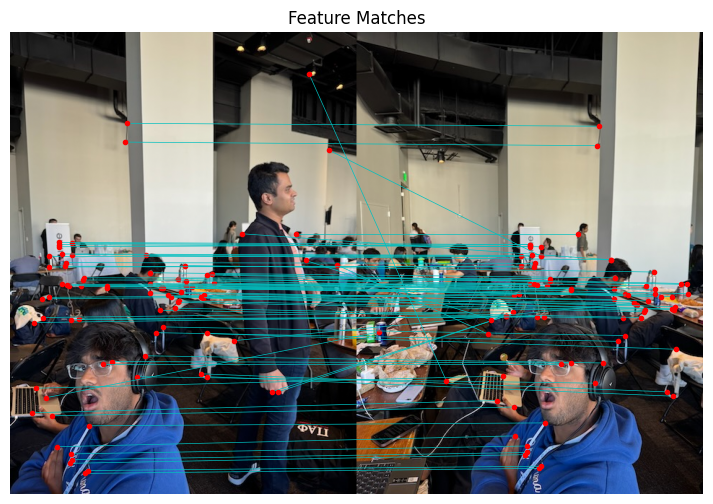

In [320]:
def feature_matching_wrapper(image1_path, image2_path):
    image1 = load_image_as_float(image1_path)
    image2 = load_image_as_float(image2_path)
    # get points from image 1
    h, coords1 = get_harris_corners(image1, edge_discard=20, threshold=0.5)
    coords1 = ANMS_help(h, coords1, n_best=500, c_robust=0)
    # get points from image 2
    h, coords2 = get_harris_corners(image2, edge_discard=20, threshold=0.5)
    coords2 = ANMS_help(h, coords2, n_best=500, c_robust=0)
    # compute descriptors
    descriptors1, valid_keypoints1 = extract_features(image1, coords1)
    descriptors2, valid_keypoints2 = extract_features(image2, coords2)
    # match features
    matches = match_features(descriptors1, descriptors2, ratio_threshold=0.7)
    print("matches shape: ", len(matches))
    print("matches: ", matches[:10])
    plot_matches(image1, image2, valid_keypoints1, valid_keypoints2, matches)
    return matches, valid_keypoints1, valid_keypoints2, image1, image2

matches, valid_keypoints1, valid_keypoints2, image1, image2 = feature_matching_wrapper('IMG_2828.jpeg', 'IMG_2827.jpeg')


# STEP 4: RANSAC to find homography

1. compute "candidate" homography between 4 random matches
2. apply homography to all keypoints from image 1
3. compute distances between projected points and actual points
4. if distance is less than threshold, it is an inlier
5. loop over num_iterations
5. keep the homography with the most inliers

In [313]:
import random

def ransac_homography(matched_points1, matched_points2, num_iterations=1000, inlier_threshold=5.0):
    
    max_inliers = 0
    best_H = None
    best_inliers = None

    num_points = matched_points1.shape[0]

    for _ in range(num_iterations):
        # Randomly select 4 matching points
        indices = random.sample(range(num_points), 4)
        p1_sample = matched_points1[indices]
        p2_sample = matched_points2[indices]

        # Compute homography
        try:
            H = computeH(p1_sample, p2_sample)
        except np.linalg.LinAlgError:
            continue  # Skip if computation fails

        # Transform all points from image 1 to image 2
        ones = np.ones((num_points, 1))
        points1_hom = np.hstack([matched_points1, ones])
        projected_points = (H @ points1_hom.T).T  # Shape: (N, 3)

        # Normalize homogeneous coordinates
        projected_points /= projected_points[:, [2]]

        # Compute distances between projected points and actual points
        errors = np.linalg.norm(matched_points2 - projected_points[:, :2], axis=1)

        # Identify inliers
        inliers = errors < inlier_threshold
        num_inliers = np.sum(inliers)

        # Update best homography if current one has more inliers
        if num_inliers > max_inliers:
            max_inliers = num_inliers
            best_H = H
            best_inliers = inliers

        # Early exit if a high percentage of inliers is found
        if num_inliers > 0.8 * num_points:
            break

    if best_H is None:
        raise RuntimeError("RANSAC failed to find a valid homography.")

    # Recompute homography using all inliers
    inlier_p1 = matched_points1[best_inliers]
    inlier_p2 = matched_points2[best_inliers]
    best_H = computeH(inlier_p1, inlier_p2)

    return best_H, best_inliers

def ransac_homography_wrapper(keypoints1, keypoints2, matches, num_iterations=1000, inlier_threshold=3.0):
    # Extract matched keypoints
    matched_keypoints1 = np.array([keypoints1[i] for i, _ in matches])
    matched_keypoints2 = np.array([keypoints2[j] for _, j in matches])
    return ransac_homography(matched_keypoints1, matched_keypoints2, num_iterations=num_iterations, inlier_threshold=inlier_threshold)

/var/folders/zq/lptg8bhj1_7csl86sd1517pc0000gn/T/ipykernel_85216/3774766964.py:21: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  h = np.linalg.lstsq(A, B)[0]


Estimated Homography Matrix:
[[ 6.20052632e-01 -7.27239454e-02  2.04242267e+02]
 [-2.01126828e-01  8.48477044e-01  4.12869472e+01]
 [-7.49249845e-04 -5.06746564e-05  1.00000000e+00]]


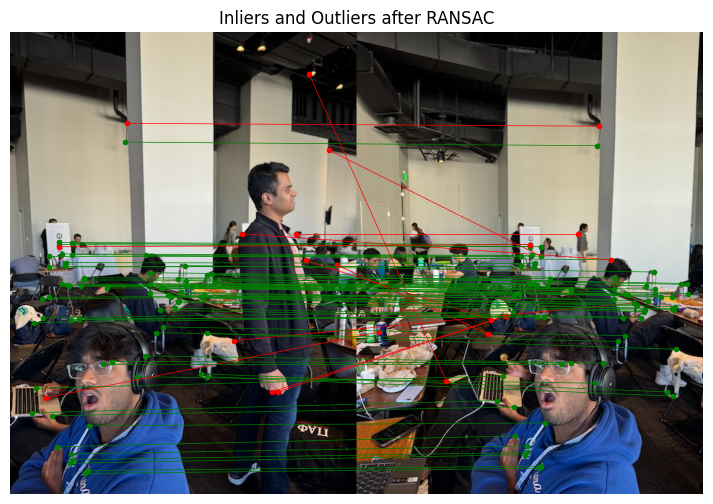

In [321]:
# Perform RANSAC to find the best homography
H, inliers = ransac_homography_wrapper(valid_keypoints1, valid_keypoints2, matches, num_iterations=1000, inlier_threshold=3.0)

print("Estimated Homography Matrix:")
print(H)
# Optionally, visualize inliers and outliers
def plot_inliers(im1, im2, keypoints1, keypoints2, matches, inliers):
    # Create a list of matches with indices corresponding to the inliers array
    matches_with_indices = [(i, j) for i, (i, j) in enumerate(matches)]
    # Convert to uint8 but keep color channels
    im1 = (im1 * 255).astype(np.uint8)
    im2 = (im2 * 255).astype(np.uint8)
    
    # Get dimensions
    height1, width1 = im1.shape[:2]
    height2, width2 = im2.shape[:2]
    
    # Create combined color image
    combined_image = np.zeros((max(height1, height2), width1 + width2, 3), dtype=im1.dtype)
    combined_image[0:height1, 0:width1] = im1
    combined_image[0:height2, width1:width1 + width2] = im2

    keypoints2_shifted = keypoints2.copy()
    keypoints2_shifted[:, 0] += width1

    plt.figure(figsize=(12, 6))
    plt.imshow(combined_image)

    for idx, (i, j) in enumerate(matches):
        x1, y1 = keypoints1[i]
        x2, y2 = keypoints2_shifted[j]
        if inliers[idx]:
            color = 'g'  # Green for inliers
        else:
            color = 'r'  # Red for outliers
        plt.plot([x1, x2], [y1, y2], color=color, linewidth=0.5)
        plt.plot(x1, y1, 'o', color=color, markersize=3)
        plt.plot(x2, y2, 'o', color=color, markersize=3)
    plt.axis('off')
    plt.title('Inliers and Outliers after RANSAC')
    plt.show()

plot_inliers(image1, image2, valid_keypoints1, valid_keypoints2, matches, inliers)


inliners/total matches:  67 / 70


/var/folders/zq/lptg8bhj1_7csl86sd1517pc0000gn/T/ipykernel_85216/3774766964.py:21: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  h = np.linalg.lstsq(A, B)[0]


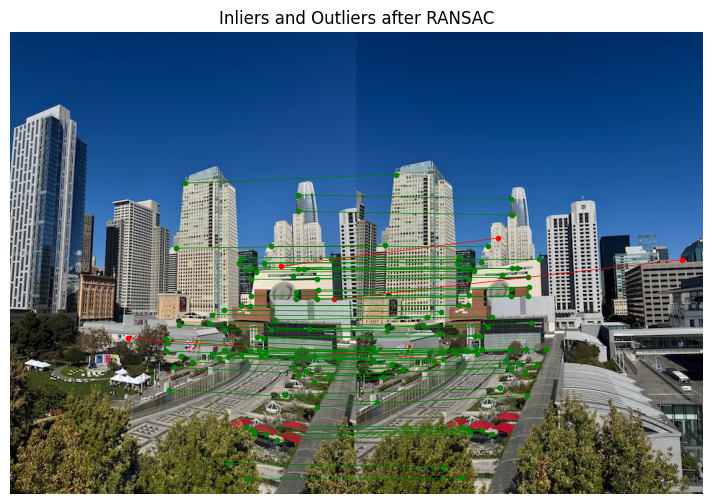

In [325]:
def homography_wrapper(image1_path, image2_path, edge_discard=20, threshold=0.5, c_robust=0.9, ratio_threshold=0.7, plot=True):
    image1 = load_image_as_float(image1_path)
    image2 = load_image_as_float(image2_path)
    # get points from image 1
    h, coords1 = get_harris_corners(image1, edge_discard=edge_discard, threshold=threshold)
    coords1 = ANMS_help(h, coords1, n_best=500, c_robust=c_robust)
    # get points from image 2
    h, coords2 = get_harris_corners(image2, edge_discard=edge_discard, threshold=threshold)
    coords2 = ANMS_help(h, coords2, n_best=500, c_robust=c_robust)
    # compute descriptors
    descriptors1, valid_keypoints1 = extract_features(image1, coords1)
    descriptors2, valid_keypoints2 = extract_features(image2, coords2)
    # match features
    matches = match_features(descriptors1, descriptors2, ratio_threshold=ratio_threshold)
    # use RANSAC to find homography
    H, inliers = ransac_homography_wrapper(valid_keypoints1, valid_keypoints2, matches, num_iterations=1000, inlier_threshold=20.0)
    # print the number of inliers and total matches
    print("inliners/total matches: ", sum(inliers), "/", len(matches))
    if plot:
        plot_inliers(image1, image2, valid_keypoints1, valid_keypoints2, matches, inliers)
    return H

H = homography_wrapper('IMG_2830.jpeg', 'IMG_2831.jpeg')


/var/folders/zq/lptg8bhj1_7csl86sd1517pc0000gn/T/ipykernel_85216/3774766964.py:21: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  h = np.linalg.lstsq(A, B)[0]


inliners/total matches:  37 / 46
len of im1Points:  24


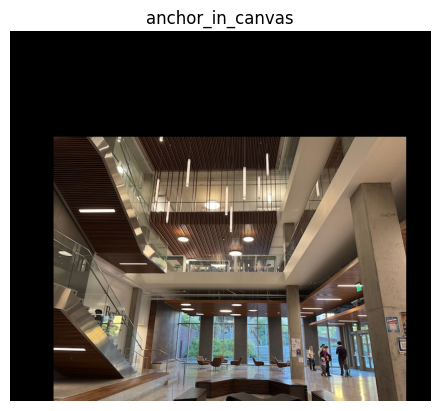

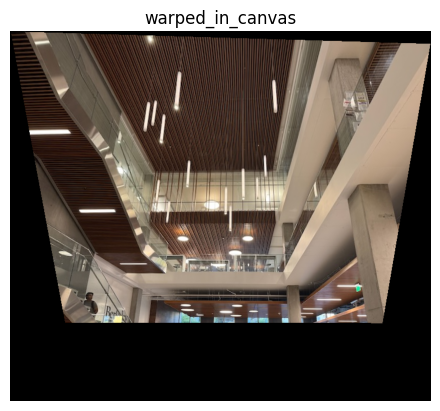

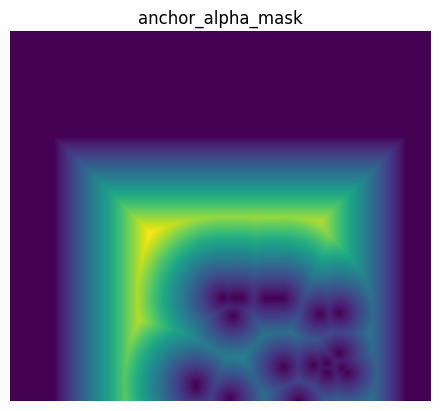

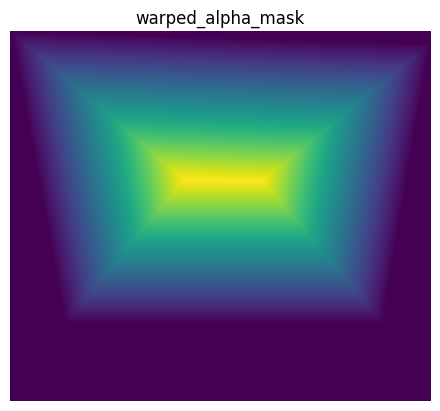

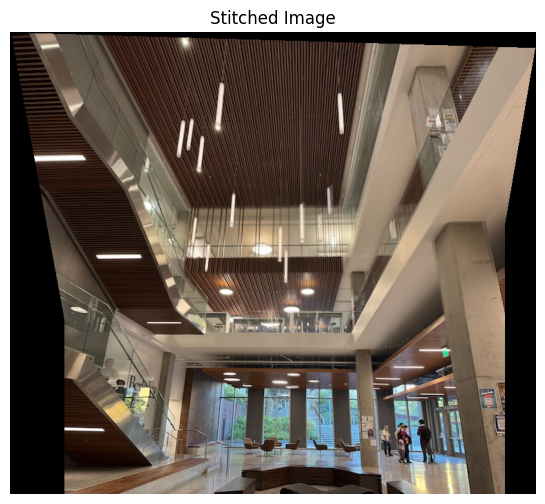

In [336]:
def auto_homography(anchorImagePath, targetImagePath):
    H = homography_wrapper(targetImagePath, anchorImagePath, plot=False)
    # THE ORDER OF THE IMAGES MATTERS AND MUST BE REVERSED
    stitched_image = full_homography(anchorImagePath, targetImagePath, H, plot=False)
    # export
    export_image(stitched_image, imname='4B/berkeleyAuto')
    return stitched_image

stitched_image = auto_homography('IMG_2814 (1).jpeg', 'IMG_2815.jpeg')

# Display the stitched image
plt.figure(figsize=(12, 6))
plt.imshow(stitched_image, cmap='gray')
plt.axis('off')
plt.title('Stitched Image')
plt.show()

In [ ]:
# compute the 